In [1]:
#STUDENT NAME: SHRUTHI
#STUDENT ID: 801218392
#HOMEWORK 0 QUESTION 2

In [2]:
#Modifying the resnet model by defining convolutional blocks

import torch
import torch.nn as nn

class ResNetBlock(nn.Module): # <1>

    def __init__(self, dim):
        super(ResNetBlock, self).__init__()
        self.conv_block = self.build_conv_block(dim)

    def build_conv_block(self, dim):
        conv_block = []

        conv_block += [nn.ReflectionPad2d(1)]

        conv_block += [nn.Conv2d(dim, dim, kernel_size=3, padding=0, bias=True),
                       nn.InstanceNorm2d(dim),
                       nn.ReLU(True)]

        conv_block += [nn.ReflectionPad2d(1)]

        conv_block += [nn.Conv2d(dim, dim, kernel_size=3, padding=0, bias=True),
                       nn.InstanceNorm2d(dim)]

        return nn.Sequential(*conv_block)

    def forward(self, x):
        out = x + self.conv_block(x) # <2>
        return out

class ResNetGenerator(nn.Module):

    def __init__(self, input_nc=3, output_nc=3, ngf=64, n_blocks=9): # <3> 

        assert(n_blocks >= 0)
        super(ResNetGenerator, self).__init__()

        self.input_nc = input_nc
        self.output_nc = output_nc
        self.ngf = ngf

        model = [nn.ReflectionPad2d(3),
                 nn.Conv2d(input_nc, ngf, kernel_size=7, padding=0, bias=True),
                 nn.InstanceNorm2d(ngf),
                 nn.ReLU(True)]

        n_downsampling = 2
        for i in range(n_downsampling):
            mult = 2**i
            model += [nn.Conv2d(ngf * mult, ngf * mult * 2, kernel_size=3,
                                stride=2, padding=1, bias=True),
                      nn.InstanceNorm2d(ngf * mult * 2),
                      nn.ReLU(True)]

        mult = 2**n_downsampling
        for i in range(n_blocks):
            model += [ResNetBlock(ngf * mult)]

        for i in range(n_downsampling):
            mult = 2**(n_downsampling - i)
            model += [nn.ConvTranspose2d(ngf * mult, int(ngf * mult / 2),
                                         kernel_size=3, stride=2,
                                         padding=1, output_padding=1,
                                         bias=True),
                      nn.InstanceNorm2d(int(ngf * mult / 2)),
                      nn.ReLU(True)]

        model += [nn.ReflectionPad2d(3)]
        model += [nn.Conv2d(ngf, output_nc, kernel_size=7, padding=0)]
        model += [nn.Tanh()]

        self.model = nn.Sequential(*model)
        
    def forward(self, input): # <3>
        return self.model(input)

In [3]:
netG = ResNetGenerator()

In [4]:
#Loading the model weights
model_path = 'C:/Users/Shruthi/Documents/HWs/RTML/hw0/images/horse2zebra_0.4.0.pth'
model_data = torch.load(model_path)
netG.load_state_dict(model_data)

<All keys matched successfully>

In [5]:
#netG.eval()

In [6]:
#importing the images and completing the necessary preprocessings by transforming them into tensors
from PIL import Image
from torchvision import transforms

In [7]:
preprocess = transforms.Compose([transforms.Resize(256),
                                 transforms.ToTensor()])

In [8]:
img1 = Image.open('C:/Users/Shruthi/Documents/HWs/RTML/hw0/images/lusitano.jpg')
img2 = Image.open('C:/Users/Shruthi/Documents/HWs/RTML/hw0/images/horse2.jpg')
img3 = Image.open('C:/Users/Shruthi/Documents/HWs/RTML/hw0/images/mh1.jpg')
img4 = Image.open('C:/Users/Shruthi/Documents/HWs/RTML/hw0/images/mh2.jpg')
img5 = Image.open('C:/Users/Shruthi/Documents/HWs/RTML/hw0/images/mh3.jpg')

In [9]:
img_t1 = preprocess(img1)
batch_t1 = torch.unsqueeze(img_t1, 0)

img_t2 = preprocess(img2)
batch_t2 = torch.unsqueeze(img_t2, 0)

img_t3 = preprocess(img3)
batch_t3 = torch.unsqueeze(img_t3, 0)

img_t4 = preprocess(img4)
batch_t4 = torch.unsqueeze(img_t4, 0)

img_t5 = preprocess(img5)
batch_t5 = torch.unsqueeze(img_t5, 0)

In [10]:
#Entering the pre-processed images into the defined CycleGAN Network
batch_out1 = netG(batch_t1)
batch_out2 = netG(batch_t2)
batch_out3 = netG(batch_t3)
batch_out4 = netG(batch_t4)
batch_out5 = netG(batch_t5)

In [11]:
#Displaying the images after removing the previously added dimension and converting the tensorarray into a numpy image array 
out_t1 = (batch_out1.data.squeeze() + 1.0) / 2.0
out_img1 = transforms.ToPILImage()(out_t1)
# out_img.save('../data/p1ch2/zebra.jpg')

out_t2 = (batch_out2.data.squeeze() + 1.0) / 2.0
out_img2 = transforms.ToPILImage()(out_t2)
# out_img.save('../data/p1ch2/zebra.jpg')

out_t3 = (batch_out3.data.squeeze() + 1.0) / 2.0
out_img3 = transforms.ToPILImage()(out_t3)
# out_img.save('../data/p1ch2/zebra.jpg')

out_t4 = (batch_out4.data.squeeze() + 1.0) / 2.0
out_img4 = transforms.ToPILImage()(out_t4)
# out_img.save('../data/p1ch2/zebra.jpg')

out_t5 = (batch_out5.data.squeeze() + 1.0) / 2.0
out_img5 = transforms.ToPILImage()(out_t5)
# out_img.save('../data/p1ch2/zebra.jpg')

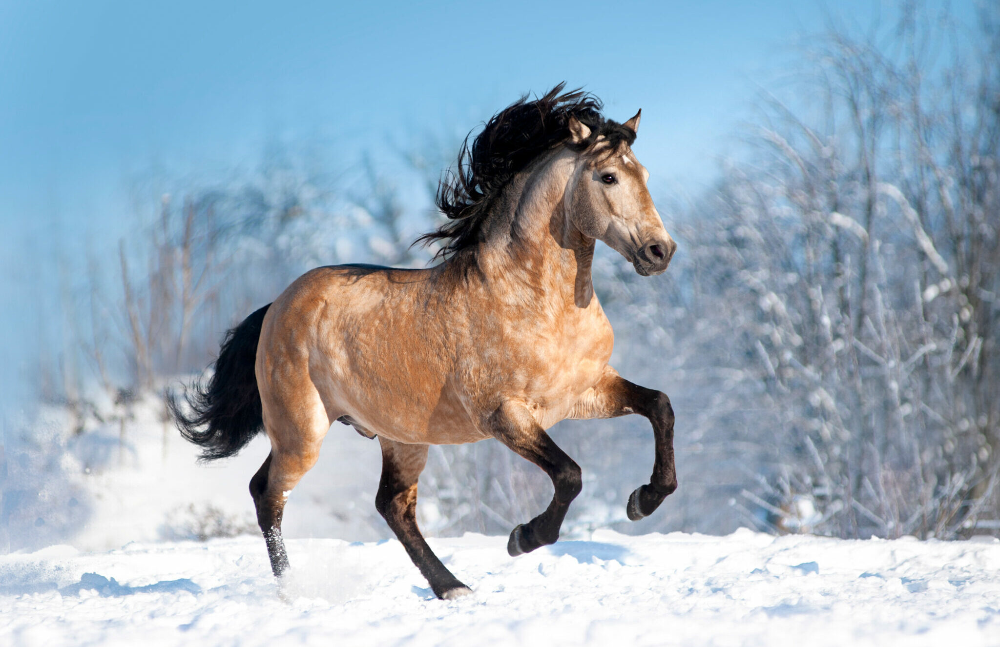

In [12]:
img1

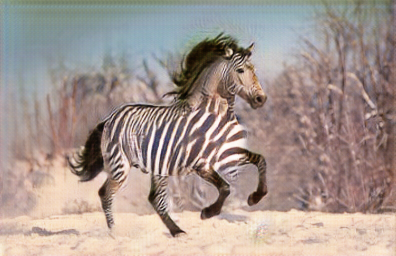

In [13]:
out_img1

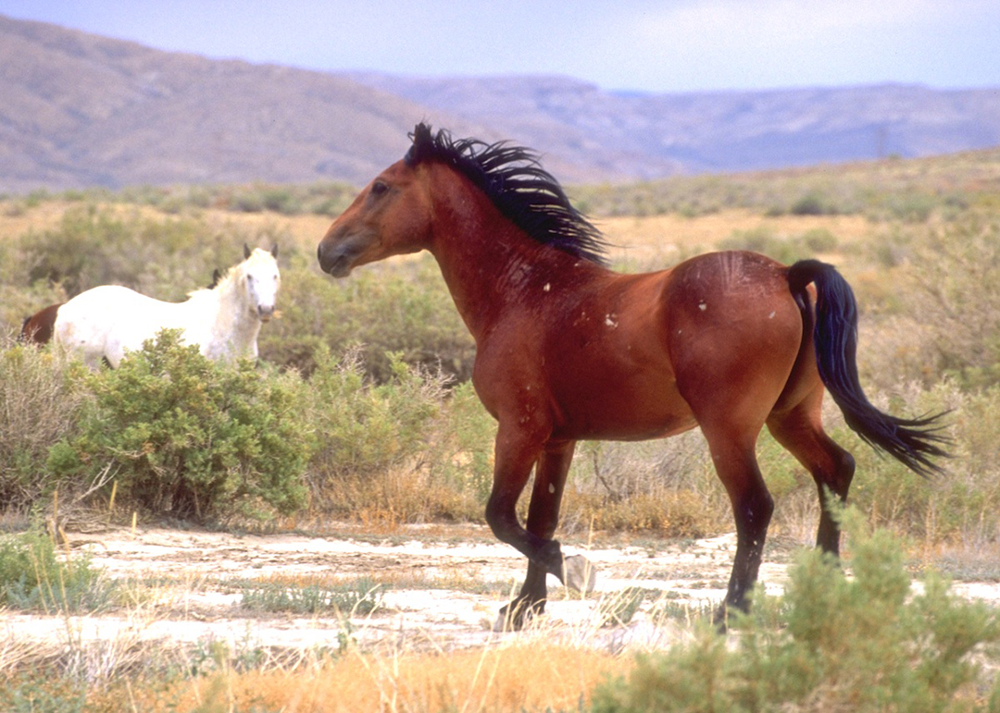

In [14]:
img2

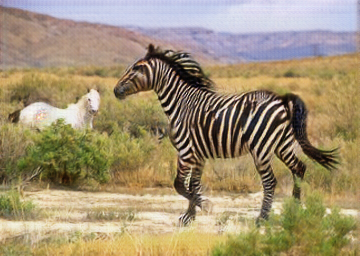

In [15]:
out_img2

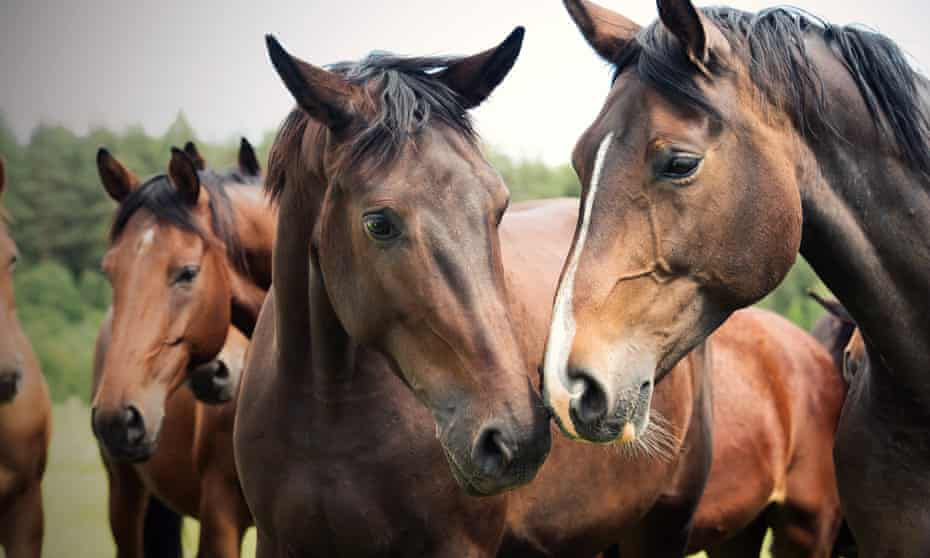

In [16]:
img3

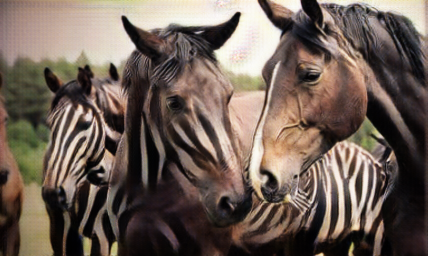

In [17]:
out_img3

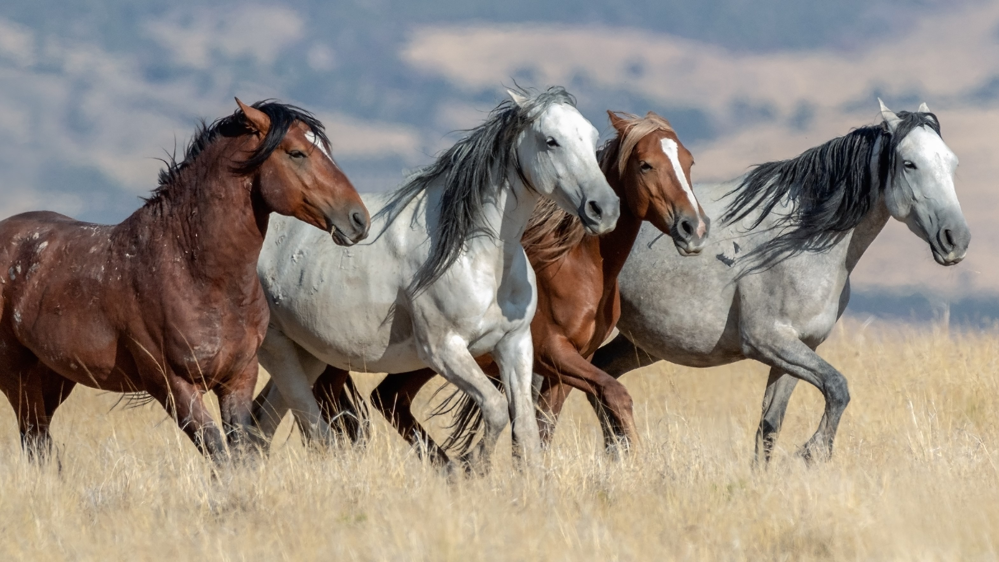

In [18]:
img4

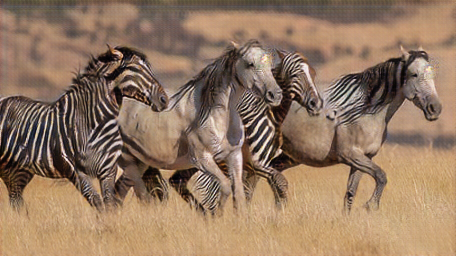

In [19]:
out_img4

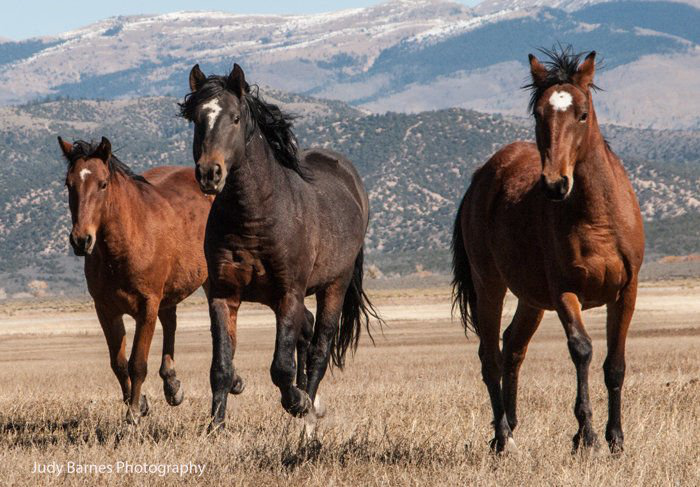

In [20]:
img5

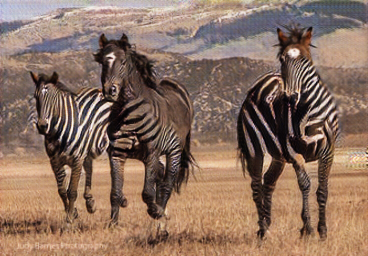

In [21]:
out_img5